In [3]:
%load_ext autoreload
import ais_predict.trajpred.posgp as pgp
import ais_predict.datasets.bigquery as bq
import matplotlib.pyplot as plt
from ais_predict.visualization import plotting
import geopandas as gpd
import pandas as pd
import seaborn as sns
import random
import numpy as np
import contextily as ctx
sns.set()
latex_width = 369.88583
plt.rcParams["figure.figsize"] = plotting.set_size(latex_width)

In [4]:
tex_fonts = {
    # Use LaTeX to write all text
    "text.usetex": True,
    "font.family": "serif",
    # Use 10pt font in plots, to match 10pt font in document
    "axes.labelsize": 10,
    "font.size": 10,
    # Make the legend/label fonts a little smaller
    "legend.fontsize": 8,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "text.latex.preamble": r'\usepackage{amsfonts}'
}

plt.rcParams.update(tex_fonts)

In [5]:
d = bq.download(limit=None)


In [27]:
d.cog += 180

In [8]:
df = pd.read_pickle("datasets/raw.pkl")
df = gpd.GeoDataFrame(df)
df["position"] = gpd.points_from_xy(df.long, df.lat, crs="wgs84")
df.timestamp = pd.to_datetime(df.timestamp, unit="d", origin="1900-01-01")
df = df.set_geometry("position")

In [19]:
df

,mmsi,imo,timestamp,cog,heading,sog,lat,long,status,position
0,314377000,9491733,2015-04-10 02:41:56.000000000,230.5,232.0,1.632413,64.038988,8.320470,0,POINT (8.32047 64.03899)
1,258799000,9392547,2015-04-10 02:46:19.000001024,244.2,242.0,7.725375,63.888655,9.003408,0,POINT (9.00341 63.88865)
2,257659800,9688960,2015-04-10 03:09:18.999999232,241.2,241.0,9.449889,63.504525,9.103902,0,POINT (9.10390 63.50452)
3,257549000,9614713,2015-04-10 03:11:20.999999488,181.2,184.0,10.988648,63.237113,8.134437,0,POINT (8.13444 63.23711)
4,257549000,9614713,2015-04-10 04:06:48.000000768,187.1,197.0,10.351384,63.261797,8.136848,0,POINT (8.13685 63.26180)
...,...,...,...,...,...,...,...,...,...,...
2995639,257684700,9693850,2015-04-06 15:31:39.000000000,131.8,142.0,27.086168,63.415517,8.723643,0,POINT (8.72364 63.41552)
2995640,258435000,7369027,2015-04-06 15:53:24.999999232,241.5,239.0,9.154259,63.575405,9.384102,0,POINT (9.38410 63.57541)
2995641,257644000,9692167,2015-04-06 15:56:43.999996160,213.9,216.0,12.478366,64.031307,10.008517,0,POINT (10.00852 64.03131)
2995642,257277400,5132626,2015-04-06 16:05:08.000000000,283.0,289.0,8.830305,63.648848,9.510788,0,POINT (9.51079 63.64885)


In [6]:
from ais_predict.datasets.raw_ais import convert_ais_df_to_trajectories

d = convert_ais_df_to_trajectories(d)

,mmsi,position,timestamp,cog,sog,traj_length,duration,mmsi_1,timestamp_1,position_1,...,mmsi_18,timestamp_18,position_18,cog_18,sog_18,mmsi_19,timestamp_19,position_19,cog_19,sog_19
28,209432000,POINT (531915.781 7057069.999),2015-12-01 13:10:37.000012+00:00,60.9,12.168698,8,1459.0,209432000.0,2015-12-01 13:16:44.999990+00:00,POINT (533910.629 7058144.904),...,NaN,NaT,None,NaN,NaN,NaN,NaT,None,NaN,NaN
29,209432000,POINT (533910.629 7058144.904),2015-12-01 13:16:44.999990+00:00,66.3,11.915435,7,1092.0,209432000.0,2015-12-01 13:17:35.000016+00:00,POINT (534188.302 7058260.625),...,NaN,NaT,None,NaN,NaN,NaN,NaT,None,NaN,NaN
30,209432000,POINT (534188.302 7058260.625),2015-12-01 13:17:35.000016+00:00,69.1,11.699529,6,1041.0,209432000.0,2015-12-01 13:18:06.999984+00:00,POINT (534370.784 7058330.948),...,NaN,NaT,None,NaN,NaN,NaN,NaT,None,NaN,NaN
31,209432000,POINT (534370.784 7058330.948),2015-12-01 13:18:06.999984+00:00,69.8,11.884102,5,1010.0,209432000.0,2015-12-01 13:22:46.000012+00:00,POINT (536037.885 7058837.762),...,NaN,NaT,None,NaN,NaN,NaN,NaT,None,NaN,NaN
43,209432000,POINT (549586.770 7031995.492),2015-12-01 14:49:26.999990+00:00,-163.1,11.382665,16,1740.0,209432000.0,2015-12-01 14:51:25.000012+00:00,POINT (549390.046 7031301.891),...,NaN,NaT,None,NaN,NaN,NaN,NaT,None,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
213088,636092635,POINT (548338.843 7027760.276),2015-10-14 20:20:10.999996+00:00,-159.0,34.164966,9,1358.0,636092635.0,2015-10-14 20:21:31.999996+00:00,POINT (548278.359 7027587.005),...,NaN,NaT,None,NaN,NaN,NaN,NaT,None,NaN,NaN
213089,636092635,POINT (548278.359 7027587.005),2015-10-14 20:21:31.999996+00:00,-160.0,4.405859,8,1277.0,636092635.0,2015-10-14 20:25:35.999990+00:00,POINT (547330.614 7026076.439),...,NaN,NaT,None,NaN,NaN,NaN,NaT,None,NaN,NaN
213090,636092635,POINT (547330.614 7026076.439),2015-10-14 20:25:35.999990+00:00,-143.0,14.211815,7,1033.0,636092635.0,2015-10-14 20:27:32.000025+00:00,POINT (546833.520 7025385.842),...,NaN,NaT,None,NaN,NaN,NaN,NaT,None,NaN,NaN
213091,636092635,POINT (546833.520 7025385.842),2015-10-14 20:27:32.000025+00:00,-143.0,14.264075,6,917.0,636092635.0,2015-10-14 20:30:12.000038+00:00,POINT (545755.902 7024256.662),...,NaN,NaT,None,NaN,NaN,NaN,NaT,None,NaN,NaN


In [14]:
df.position.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [19]:
cog_cols = d.columns[d.columns.str.contains("cog")]
d[cog_cols].diff(axis=1).fillna(0)

,cog,cog_1,cog_2,cog_3,cog_4,cog_5,cog_6,cog_7,cog_8,cog_9,cog_10,cog_11,cog_12,cog_13,cog_14,cog_15,cog_16,cog_17,cog_18,cog_19
28,0.0,5.4,2.8,0.7,8.3,1.6,63.0,24.7,-2.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29,0.0,2.8,0.7,8.3,1.6,63.0,24.7,-2.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30,0.0,0.7,8.3,1.6,63.0,24.7,-2.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31,0.0,8.3,1.6,63.0,24.7,-2.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
43,0.0,-0.1,2.9,0.8,0.6,-2.2,0.0,0.0,0.7,-0.2,0.6,18.1,1.7,6.7,2.9,0.0,-0.1,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
213088,0.0,-1.0,17.0,0.0,17.0,-1.0,1.0,0.0,-1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
213089,0.0,17.0,0.0,17.0,-1.0,1.0,0.0,-1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
213090,0.0,0.0,17.0,-1.0,1.0,0.0,-1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
213091,0.0,17.0,-1.0,1.0,0.0,-1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [36]:
ts_cols = d.columns[d.columns.str.contains("timestamp")]
cols = list(sum(zip(ts_cols, cog_cols), ()))
d[cols]

,timestamp,cog,timestamp_1,cog_1,timestamp_2,cog_2,timestamp_3,cog_3,timestamp_4,cog_4,...,timestamp_15,cog_15,timestamp_16,cog_16,timestamp_17,cog_17,timestamp_18,cog_18,timestamp_19,cog_19
28,2015-12-01 13:10:37.000012+00:00,60.9,2015-12-01 13:16:44.999990+00:00,66.3,2015-12-01 13:17:35.000016+00:00,69.1,2015-12-01 13:18:06.999984+00:00,69.8,2015-12-01 13:22:46.000012+00:00,78.1,...,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN
29,2015-12-01 13:16:44.999990+00:00,66.3,2015-12-01 13:17:35.000016+00:00,69.1,2015-12-01 13:18:06.999984+00:00,69.8,2015-12-01 13:22:46.000012+00:00,78.1,2015-12-01 13:23:54.000009+00:00,79.7,...,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN
30,2015-12-01 13:17:35.000016+00:00,69.1,2015-12-01 13:18:06.999984+00:00,69.8,2015-12-01 13:22:46.000012+00:00,78.1,2015-12-01 13:23:54.000009+00:00,79.7,2015-12-01 13:28:49.000022+00:00,142.7,...,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN
31,2015-12-01 13:18:06.999984+00:00,69.8,2015-12-01 13:22:46.000012+00:00,78.1,2015-12-01 13:23:54.000009+00:00,79.7,2015-12-01 13:28:49.000022+00:00,142.7,2015-12-01 13:30:16.999977+00:00,167.4,...,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN
43,2015-12-01 14:49:26.999990+00:00,-163.1,2015-12-01 14:51:25.000012+00:00,-163.2,2015-12-01 14:53:38.000025+00:00,-160.3,2015-12-01 14:54:15.000048+00:00,-159.5,2015-12-01 14:55:35.999961+00:00,-158.9,...,2015-12-01 15:17:56.000025+00:00,-130.6,2015-12-01 15:18:27+00:00,-130.7,NaT,NaN,NaT,NaN,NaT,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
213088,2015-10-14 20:20:10.999996+00:00,-159.0,2015-10-14 20:21:31.999996+00:00,-160.0,2015-10-14 20:25:35.999990+00:00,-143.0,2015-10-14 20:27:32.000025+00:00,-143.0,2015-10-14 20:30:12.000038+00:00,-126.0,...,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN
213089,2015-10-14 20:21:31.999996+00:00,-160.0,2015-10-14 20:25:35.999990+00:00,-143.0,2015-10-14 20:27:32.000025+00:00,-143.0,2015-10-14 20:30:12.000038+00:00,-126.0,2015-10-14 20:33:31.999968+00:00,-127.0,...,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN
213090,2015-10-14 20:25:35.999990+00:00,-143.0,2015-10-14 20:27:32.000025+00:00,-143.0,2015-10-14 20:30:12.000038+00:00,-126.0,2015-10-14 20:33:31.999968+00:00,-127.0,2015-10-14 20:37:43.000003+00:00,-126.0,...,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN
213091,2015-10-14 20:27:32.000025+00:00,-143.0,2015-10-14 20:30:12.000038+00:00,-126.0,2015-10-14 20:33:31.999968+00:00,-127.0,2015-10-14 20:37:43.000003+00:00,-126.0,2015-10-14 20:37:49.999958+00:00,-126.0,...,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN,NaT,NaN


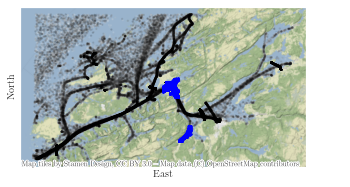

In [15]:
ax = df.sample(100000).position.to_crs(d.position.crs).plot(alpha=.1, markersize=2, rasterized=True, cmap="Greys")
d.position.plot(ax=ax, markersize=2, rasterized=True, color="Blue")
plt.xticks([])
plt.yticks([])
ctx.add_basemap(ax, crs=d.position.crs.to_string())
plt.xlabel("East")
plt.ylabel("North")
plt.savefig("map.pdf", format="pdf", bbox_inches=0, dpi=300)

In [29]:
d.groupby("mmsi").position.count().sort_values(ascending=False) / len(d.index)

mmsi
258323000    0.627568
257048700    0.128223
257374400    0.095808
257304900    0.012674
257391000    0.009029
               ...   
231711000    0.000011
314180000    0.000011
231763000    0.000011
314206000    0.000011
257233000    0.000011
Name: position, Length: 361, dtype: float64

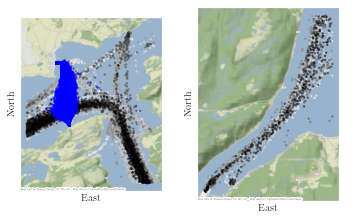

In [28]:
%autoreload
ix = d.position.y > 7.05e6
mmsi_ix = d.mmsi.isin((258323000, 257048700, 257374400))
fig, ax = plt.subplots(1, 2)
temp = d[ix]
d[ix & ~mmsi_ix].plot(markersize=2, alpha=0.5, rasterized=True, ax=ax[0], cmap="Greys")
d[mmsi_ix].plot(markersize=2, alpha=0.5, rasterized=True, ax=ax[0], color="blue")
ax[0].set_xticks([])
ax[0].set_yticks([])
ctx.add_basemap(ax[0], attribution_size=3, crs=d.position.crs.to_string())
d[~ix].plot(markersize=2, alpha=0.5, rasterized=True, ax=ax[1], cmap="Greys")
ax[1].set_xticks([])
ax[1].set_yticks([])
ctx.add_basemap(ax[1], attribution_size=3, crs=d.position.crs.to_string())
plt.tight_layout()

for a in ax:
    a.set_xlabel("East")
    a.set_ylabel("North")

plt.savefig("map1.pdf", format="pdf", bbox_inches=0, dpi=300)

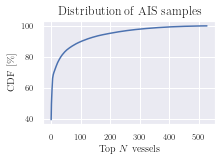

In [9]:
plt.figure(figsize=plotting.set_size(latex_width, .6))
temp = df.groupby("mmsi").position.count().sort_values(ascending=False) / len(df.index) * 100
cdf = temp.cumsum().to_numpy()
plt.plot(cdf)
plt.xlabel("Top $N$ vessels")
plt.ylabel("CDF [\%]")
plt.title("Distribution of AIS samples")
plt.savefig("mmsi_cdf.pdf", format="pdf", bbox_inches="tight", dpi=300)

In [12]:
temp

mmsi
258323000    39.353561
257048700    10.250215
257374400     5.239822
257304900     4.203869
257684700     3.806472
               ...    
211451130     0.000938
257086200     0.000938
249647000     0.000938
257720700     0.000938
257225500     0.000469
Name: position, Length: 529, dtype: float64

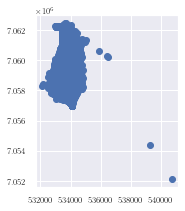

In [10]:
ax = df.loc[df.mmsi.isin((258323000, 257048700, 257374400))].plot()
#ctx.add_basemap(ax=ax)

/home/haavard/.pyenv/versions/master-thesis/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='mmsi', ylabel='imo'>

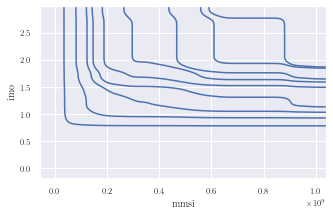

In [54]:
sns.kdeplot(temp.index, temp, cumulative=True)

In [80]:
df.sort_values(by=["mmsi", "timestamp"], inplace=True)

In [5]:
dt = df.groupby("mmsi").apply(lambda x: x.timestamp - x.timestamp.shift(1)).dropna().dt.seconds

7.333333333333333

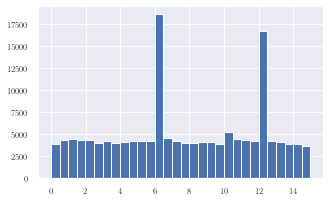

In [19]:
delta_t = dt.to_numpy()
msk = delta_t < 15*60
_ = plt.hist(delta_t[msk] / 60, bins=30)
np.median(delta_t[msk] / 60)

In [4]:
df.sort_values(by=["mmsi", "timestamp"], inplace=True)
first = df[["mmsi", "timestamp"]] 
second = first.shift(1)

dt = (first.timestamp - second.timestamp).dt.seconds.to_numpy()
dt[first.mmsi != second.mmsi] = np.nan
df["dt"] = dt

In [36]:
df

,mmsi,imo,timestamp,cog,heading,sog,lat,long,status,position,dt
1737140,927852,0,2015-01-05 12:24:39.999997696,214.4,220.0,7.253133,63.634847,8.237968,0,POINT (8.23797 63.63485),NaN
83285,927852,0,2015-01-05 12:30:40.000000256,228.0,222.0,7.332629,63.625982,8.219180,0,POINT (8.21918 63.62598),360.0
62804,927852,0,2015-01-05 12:49:00.000002048,225.9,217.0,7.294617,63.599497,8.160927,0,POINT (8.16093 63.59950),1100.0
2489550,927852,0,2015-01-05 13:13:34.000003328,225.1,219.0,7.361661,63.564597,8.081430,0,POINT (8.08143 63.56460),1474.0
1615137,927852,0,2015-01-05 13:44:06.000002816,141.2,140.0,6.210985,63.540597,8.038272,0,POINT (8.03827 63.54060),1831.0
...,...,...,...,...,...,...,...,...,...,...,...
606941,982581501,0,2015-11-27 09:32:38.999998976,263.9,263.0,19.042138,63.313253,8.558257,0,POINT (8.55826 63.31325),139.0
580560,982581501,0,2015-11-27 09:35:27.000003840,249.8,241.0,8.213202,63.312755,8.544140,0,POINT (8.54414 63.31276),168.0
445534,982581501,0,2015-11-27 09:36:20.000001536,292.9,244.0,0.633777,63.312902,8.544028,0,POINT (8.54403 63.31290),52.0
381960,982581501,0,2015-11-27 09:53:58.000004352,263.7,258.0,15.523148,63.301740,8.512602,0,POINT (8.51260 63.30174),1058.0


In [54]:
df = df.reset_index(drop=True)
    

In [6]:
group = df.set_index("timestamp").groupby(["mmsi", pd.Grouper(freq="30Min")])

In [24]:
temp = group.filter(lambda x: len(x.index) > 4 and (x.reset_index().timestamp.max() - x.reset_index().timestamp.min()).seconds > 15*60)

In [25]:
len(df.index) - len(temp.index) 

630704